#**Install YOLOv5 dependencies**

In [1]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  
%cd yolov5

# install YOLO
!pip install -qr requirements.txt  # install dependencies

# import lib
import torch

from IPython.display import Image, display # to display images
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Cloning into 'yolov5'...
remote: Enumerating objects: 13635, done.
remote: Counting objects: 100% (159/159), done.
remote: Compressing objects: 100% (77/77), done.
remote: Total 13635 (delta 109), reused 120 (delta 82), pack-reused 13476
Receiving objects: 100% (13635/13635), 12.18 MiB | 31.66 MiB/s, done.
Resolving deltas: 100% (9509/9509), done.
/content/yolov5
     |████████████████████████████████| 596 kB 27.7 MB/s 
Setup complete. Using torch 1.11.0+cu113 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


#**Download custom data from Roboflow**

In [2]:
%cd /content/yolov5
# install roboflow lib
!pip install roboflow

from roboflow import Roboflow

# i write her my API key to my Account on roboflow to let download the data
rf = Roboflow(api_key="bNDv0KVvtylDqWLLNXdz")

# we write the data we want and its version (i choose aicook data v4)
project = rf.workspace("karel-cornelis-q2qqg").project("aicook-lcv4d")
dataset = project.version(4).download("yolov5")

/content/yolov5
     |████████████████████████████████| 145 kB 21.8 MB/s 
     |████████████████████████████████| 178 kB 47.9 MB/s 
     |████████████████████████████████| 1.1 MB 62.4 MB/s 
     |████████████████████████████████| 67 kB 6.2 MB/s 
     |████████████████████████████████| 54 kB 3.4 MB/s 
     |████████████████████████████████| 138 kB 54.6 MB/s 
     |████████████████████████████████| 63 kB 1.9 MB/s 
  Created wheel for roboflow: filename=roboflow-0.2.4-py3-none-any.whl size=21356 sha256=56bbf74678872dfe389a3d758b125cd4e5883260a32e12bbea280a3d13f07370
  Stored in directory: /root/.cache/pip/wheels/b7/2c/60/3733c0e323b1d7aec00f852264314bf6c48192c8e1dc92b3ee
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=63a0122760c33baeca50cffa96ab68a18f3b8f914efd8dc1e753f38ef3057ce9
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built roboflow wget
  Attempting uninstall: urllib3
    Foun

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to aicook-4 in yolov5pytorch:: 100%|██████████| 6112/6112 [00:08<00:00, 740.96it/s] 


In [3]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- apple
- banana
- beef
- blueberries
- bread
- butter
- carrot
- cheese
- chicken
- chicken_breast
- chocolate
- corn
- eggs
- flour
- goat_cheese
- green_beans
- ground_beef
- ham
- heavy_cream
- lime
- milk
- mushrooms
- onion
- potato
- shrimp
- spinach
- strawberries
- sugar
- sweet_potato
- tomato
nc: 30
train: aicook-4/train/images
val: aicook-4/valid/images


#**Define Model Configuration and Architecture**

In [4]:
# define number of classes based on data.yaml
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [5]:
# customize iPython writefile so we can write variables to the custom yaml file
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [6]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors: 
  - [29,19, 44,13, 21,34]  # P3/8
  - [45,21, 57,23, 47,29]  # P4/16
  - [37,44, 75,25, 62,35]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

#**Train the model**

In [7]:
# train yolov5s on custom data for 50 epochs
# time its performance
%%time 
%cd /content/yolov5/
!python train.py --img 320 --batch 58 --epochs 50 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/yolov5/aicook-4/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=58, imgsz=320, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 4, done.
remote: Counting objects: 100% (4/4), done.
remote: Total 4 (delta 3), reused 4 (delta 3), pack-reused 0
Unpacking objects: 100% (4/4), done.
From https://github.com/ultralytics/yolov5
   1a3af0b..b7cf76a  update/ConvTranspose2d -> origin/update/ConvTranspose2d
github: up to date with https://github.com/ultralytic

#**Display the Performance of the model**

In [8]:
# we use tensorboard to compare between the models we write to choose the best of them
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

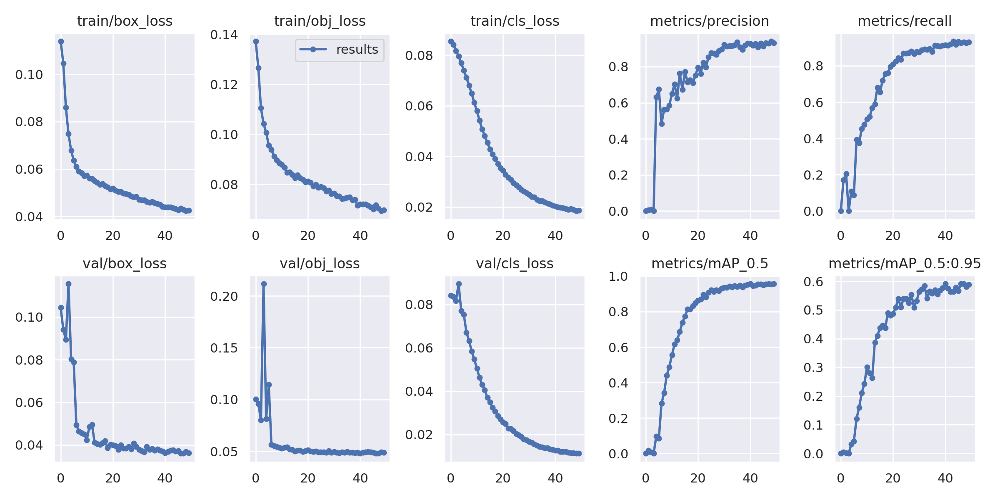

In [9]:
# we plot the result
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

GROUND TRUTH AUGMENTED TRAINING DATA:


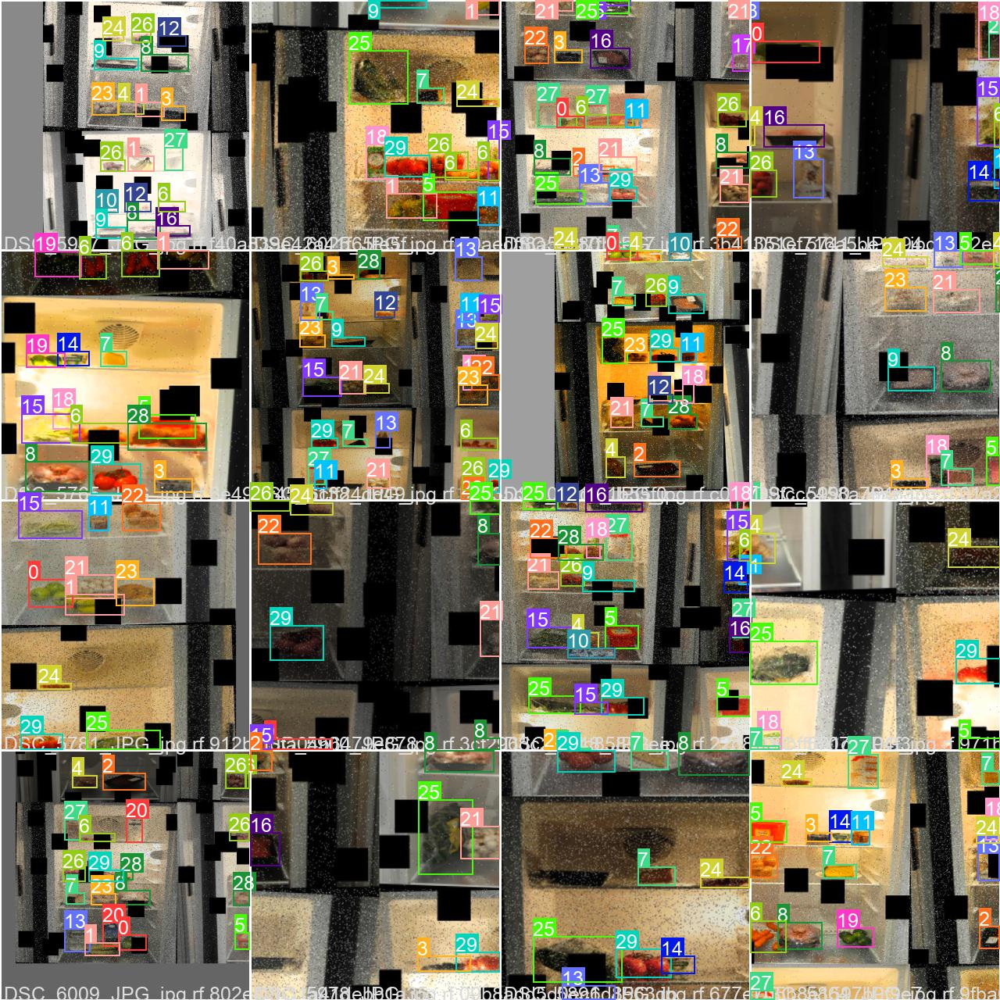

In [10]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

#**Test the model**

In [13]:
# we test our model using test images
# use the best weights If we want to test on the basis of the best epoch
# use the last weights If we want to test on the basis of the last epoch we trained
%%time
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source aicook-4/test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=aicook-4/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-206-ga9a92ae Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7324731 parameters, 0 gradients, 17.0 GFLOPs
image 1/51 /content/yolov5/aicook-4/test/images/DSC_5941_JPG_jpg.rf.7f34ef03affd2f952f6519e8506d8cdc.jpg: 416x416 1 apple, 1 bread, 1 carrot, 1 chocolate, 1 flour, 1 green_beans, 1 ground_beef, 1 lime, 1 potato, 1 strawberries, 2 sugars, 1 tomato, Done. (0.013s)
image 2/51 /content/yolov5/aicook-4/test/images/DSC_5945_JPG

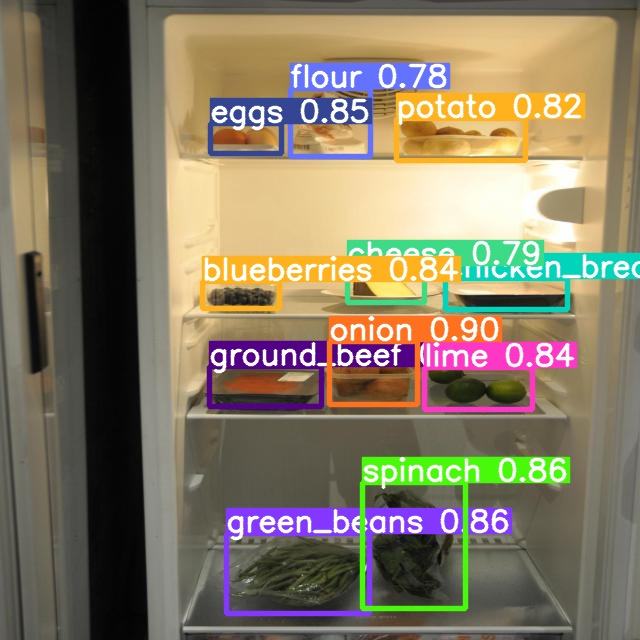

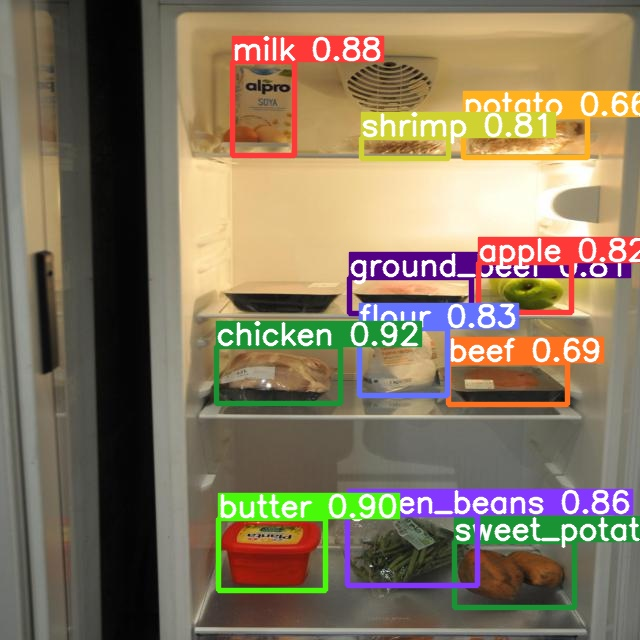

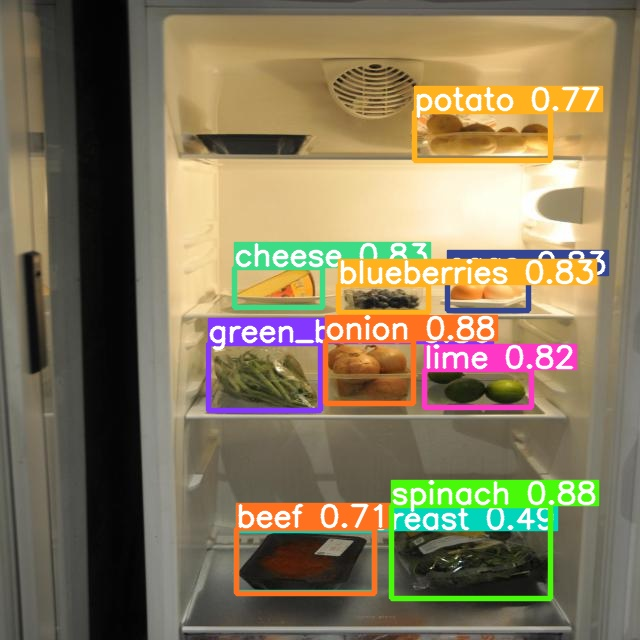

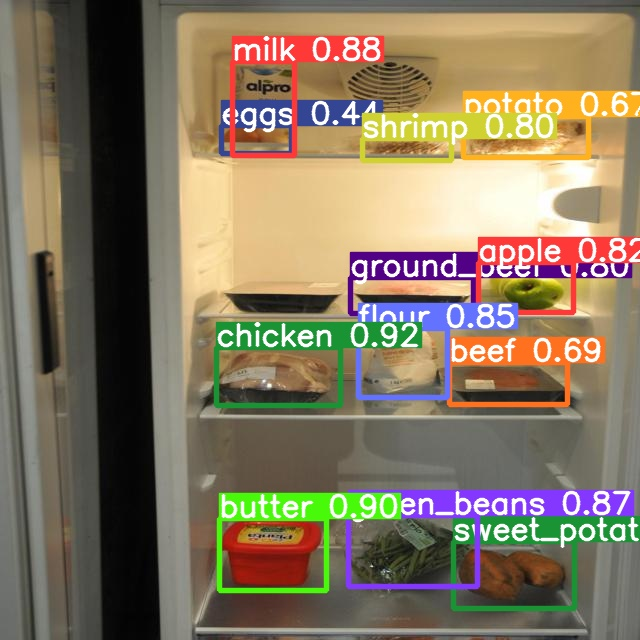

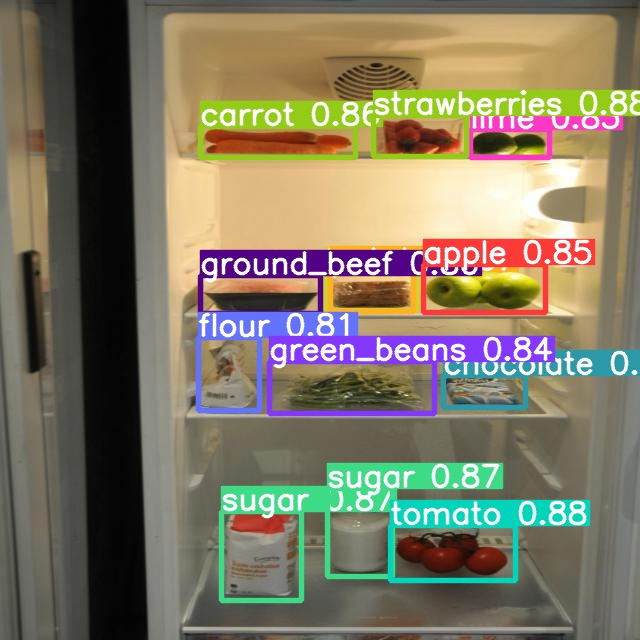

...

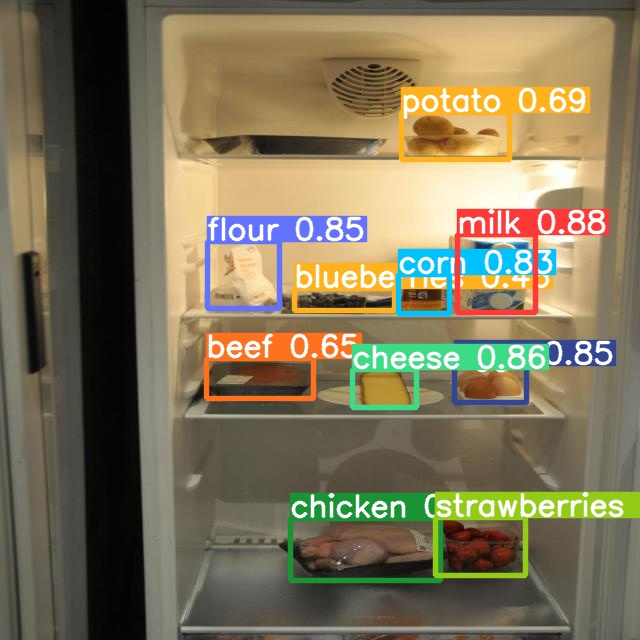

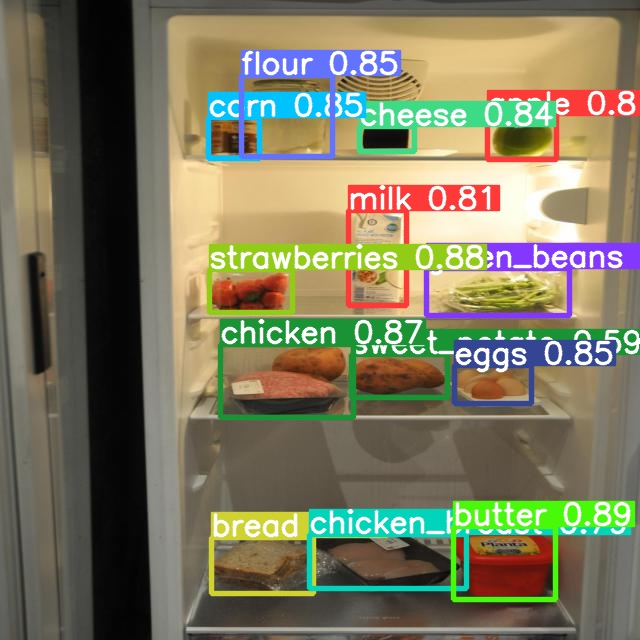

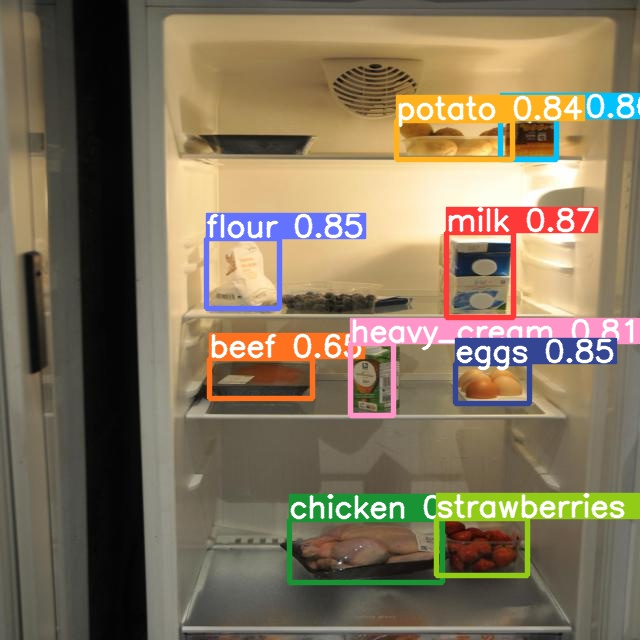

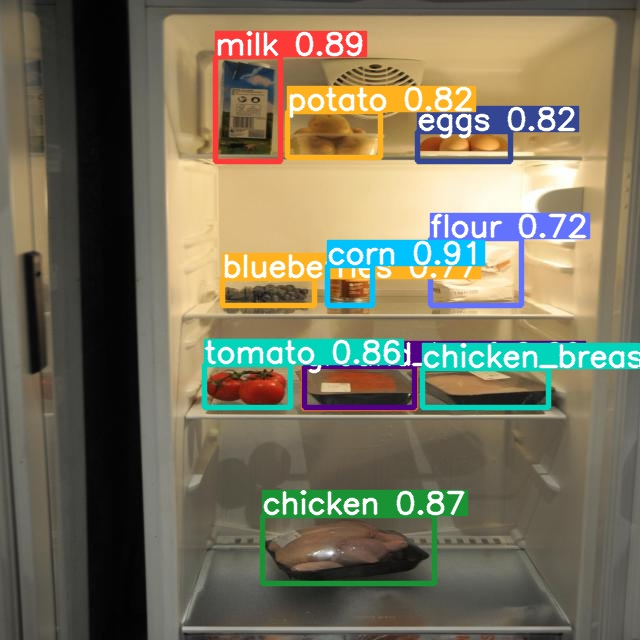

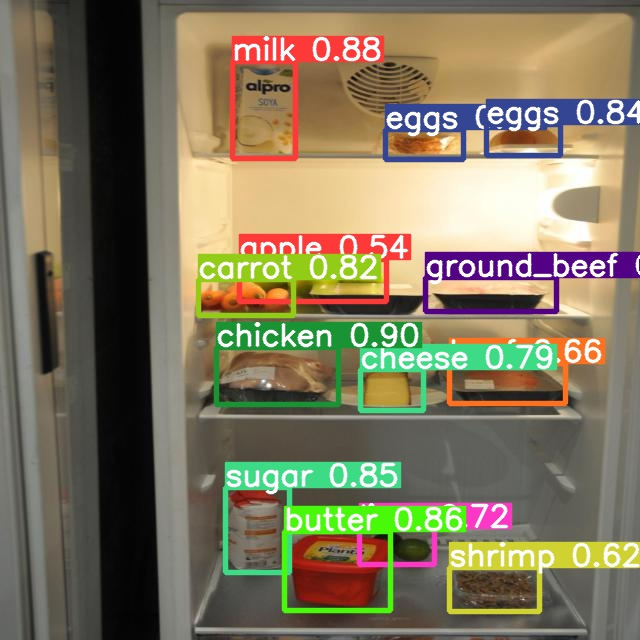

In [15]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'):
    display(Image(filename=imageName,width=900))
    print("\n")